# MMI727 - TERM PROJECT - PHASE3 - 2095693



In [1]:
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms, models
import torchvision.transforms as transforms
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
import glob
from PIL import Image
import os
import pandas as pd

#using google colab environment is used, required files are on the drive.
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


# **DATA PREPROCESSING - MODELS SELECTION**

LOAD IMAGENET PRETRAINED MODELS AND SPECIFY RELATED TRANSFORMATIONS

In [2]:
#check device to direct operations
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

# Define the models and desired weigths
model_mobilenet = torch.hub.load("pytorch/vision", "mobilenet_v2", weights='IMAGENET1K_V1')
model_mobilenet = model_mobilenet.to(device)
model_resnet = torch.hub.load("pytorch/vision", "resnet50", weights="IMAGENET1K_V2")
model_resnet = model_resnet.to(device)
model_inception = torch.hub.load("pytorch/vision", "inception_v3", weights='IMAGENET1K_V1')
model_inception = model_inception.to(device)

# Specify the transformations
transform_r_m = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize the images to match the expected input size of ResNet and MobileNet (224x224)
    transforms.ToTensor() #convert them to tensors
])

transform_i = transforms.Compose([
    transforms.Resize((229, 229)),  # Resize the images to match the expected input size of Inceptionv3 (229x229)
    transforms.ToTensor(),
])

cuda


Downloading: "https://github.com/pytorch/vision/zipball/main" to /root/.cache/torch/hub/main.zip
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 121MB/s] 
Using cache found in /root/.cache/torch/hub/pytorch_vision_main
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 235MB/s]
Using cache found in /root/.cache/torch/hub/pytorch_vision_main
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 173MB/s] 


LOAD IMAGENET DERIVED TEST_DATASET (KAGGLE NIPS)

In [3]:
# Original Images and dataset.csv files are on the google drive directory.
# Specify the path
root = './gdrive/MyDrive/Phase2/NIPS_Images'

# Find all the .png files in the directory
image_paths = glob.glob(root + '/*.png')
#Load the csv file
csv_path = "./gdrive/MyDrive/Phase2/dev_dataset.csv"
df = pd.read_csv(csv_path)


# Create different datasets with corresponding transforms on the images and extract label, target, image_name info
def datasets (transform, image_paths):
  # Initialize empty arrays
  test_dataset= []
  control_dataset= []
  for path in image_paths:
    # Open image
    image = Image.open(path)
    # Get image name
    image_name = os.path.splitext(os.path.basename(path))[0]
    # Finding corresponding label and target to an image from the csv file, using image_name as key
    matching_row = df[df['ImageId'] == image_name]
    # I observed a pattern between predicted labels and true labels such that predicted label is mostly label+1.
    # Then I checked for the values in the csv file and see that there are target class = 1000 and no true label or target = 0 instances.
    # As Imagenet classes are in range [0-999] and it is expected from these pretrained models to perform well on non-attacked test sets,
      #I substracted 1 from true label and target labels, otherwise accuracies are even worse then 1% and targeted attacks gives error.
    if not matching_row.empty:
      true_label = matching_row['TrueLabel'].values[0] - 1
      target = matching_row['TargetClass'].values[0] - 1
    #Applying different transforms for different datasets
    image = transform(image)
    test_dataset.append([image, true_label])
    control_dataset.append([image_name, image, true_label, target])
  return test_dataset, control_dataset

In [4]:
test_dataset_r, control_dataset_r = datasets(transform_r_m, image_paths)
test_dataset_m, control_dataset_m = datasets(transform_r_m, image_paths)
test_dataset_i, control_dataset_i = datasets(transform_i, image_paths)

In [5]:

test_loader_r = torch.utils.data.DataLoader(control_dataset_r, batch_size=1, shuffle=True, num_workers=2)
test_loader_m = torch.utils.data.DataLoader(control_dataset_m, batch_size=1, shuffle=True, num_workers=2)
test_loader_i = torch.utils.data.DataLoader(control_dataset_i, batch_size=1, shuffle=True, num_workers=2)

In [6]:
def calculate_test_accuracy (model, test_loader):

  # While not training model can be moved to eval mode
  model.eval()
  correct = 0
  total = 0
  # No need for grad computations
  with torch.no_grad():
    for name, images, labels, targets in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        # Counting corrects if predicted label is same as the ground truth
        if predicted.item() == labels.item():
            correct = correct +1

  accuracy = 100 * correct / total
  print(f"Accuracy on original test dataset: {accuracy:.2f}%")

CALCULATE PRETRAINED MODELS' PERFORMANCES WITH THE ORIGINAL DATASET

In [ ]:
print('Model_Resnet_50')
calculate_test_accuracy(model_resnet, test_loader_r)
print('Model_MobileNet_v2')
calculate_test_accuracy(model_mobilenet, test_loader_m)
print('Model_Inception_v3')
calculate_test_accuracy(model_inception, test_loader_i)

Model_Resnet_50
Accuracy on original test dataset: 95.10%
Model_MobileNet_v2
Accuracy on original test dataset: 47.09%
Model_Inception_v3
Accuracy on original test dataset: 59.98%


In [ ]:
# Function for visualization
def torch_imshow(img):
    img = img.permute(1,2,0)
    plt.imshow(img.cpu().numpy())
    plt.show()

VISUALIZATION OF SUBSET FROM THE DATASET

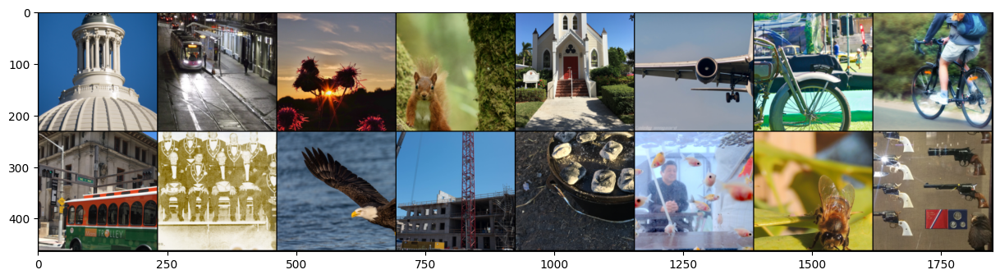

In [ ]:
from torchvision.utils import make_grid
import numpy
# Just to show what the images look like, taking sample with size 16 and visualizing it. It may change on every run as loader is random
visual_l = torch.utils.data.DataLoader(control_dataset_i, batch_size=16, shuffle=True, num_workers=2)
for _, images, _, _ in visual_l:
    break
#print(images)
im=make_grid(images,nrow=8)
plt.figure(figsize=(15,15))
plt.imshow(np.transpose(im.numpy(),(1,2,0)))

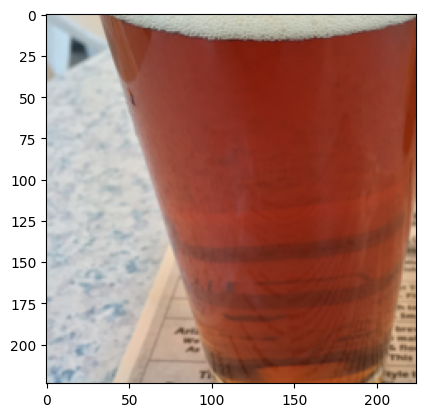

442 

torch.Size([3, 224, 224]) 



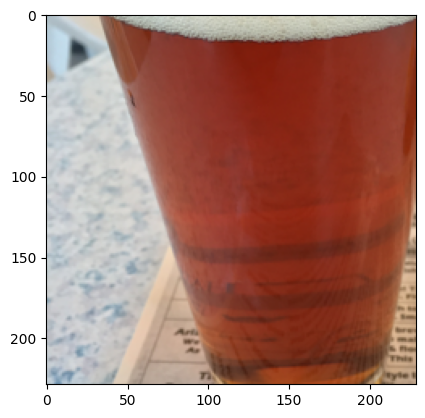

442 

torch.Size([3, 229, 229]) 



In [ ]:
# To show what different transforms changed in terms  of inputs to be provided to models
# And checking consistency (except the sizes) between image order and true labels

_, image_r, label_r, _ = control_dataset_r[60]
torch_imshow(image_r)
print(label_r, '\n')
print(image_r.shape, '\n')

_, image_i, label_i, _ = control_dataset_i[60]
torch_imshow(image_i)
print(label_i, '\n')
print(image_i.shape, '\n')

#Difference is size



--- ---



# **ATTACKS**

## Fast Gradient Sign Method (FGSM)

In [7]:
# FGSM attack code
def fgsm_attack(image, epsilon, data_grad):
    # Collect the element-wise sign of the data gradient
    sign_data_grad = data_grad.sign()
    # Create the perturbed image by adjusting each pixel of the input image, according to the given epsilon and gradient above
    perturbed_image = image + epsilon*sign_data_grad
    # Adding clipping to maintain [0,1] range
    perturbed_image = torch.clamp(perturbed_image, 0, 1)
    # Return the perturbed image
    return perturbed_image

In [8]:
# Testing models' accuracies under FGSM attack with specified model, device, loader, epsilon, targeted options. Default value for targeted is False.
def test_FGSM( model, device, loader, epsilon, targeted = False):

    # Accuracy counter
    correct = 0
    adv_examples = []
    model.to(device)
    model.eval()
    perturbations = []
    original_images = []

    # Loop over all examples in test set
    for image_name, image, label, target in loader:
      # Send the iamge, label and target to the device
        image = image.to(device)
        label = label.to(device)
        target = target.to(device)

        # Set requires_grad attribute of tensor. Important as image_grad will be used for attack
        image.requires_grad = True

        # Forward pass the data through the model
        output = model(image)
        init_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

        # If the initial prediction is wrong, no need for attacking
        if (init_pred.item()) != label.item():
            continue

        # Calculate the loss according to targeted input
        # For the targeted attacks aim is to maximize loss between predicted and target, so manipulate model to give closer predictions to target
        if targeted == True :
            loss = - (F.nll_loss(output, target))
        # In general, aim is to minimize loss between predicted and true label
        else :
            loss = F.nll_loss(output, label)
        # Zero all existing gradients
        model.zero_grad()

        # Calculate gradients of model in backward pass
        loss.backward()

        # Collect ``datagrad`` for attack
        data_grad = image.grad.data

        # Call FGSM Attack
        perturbed_data = fgsm_attack(image, epsilon, data_grad)

        # Collect perturbation without applying it to the image
        perturbation = perturbed_data - image
        perturbation = torch.clamp(perturbation, 0, 1)
        pert = perturbation.squeeze().detach().cpu().numpy()
        #perturbations.append(perturbation)
        #original_images.append(image)

        # Re-classify the perturbed image
        output = model(perturbed_data)

        # Check for success
        final_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

        if (final_pred.item()) == label.item():
            correct += 1
            # Special case for saving 0 epsilon examples, if model predicted the label correctly (not mistakenly with greater than 0 epsilon), keep the image for visualization)
            if (epsilon == 0) and (len(adv_examples) < 5):
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                org = image.squeeze().detach().cpu().numpy()
                #pert = perturbation.squeeze().detach().cpu().numpy()
                # to show original images, in terms of 0 epsilon adv_ex will be same as the image
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex, image_name, org, pert ))
        else:
            # Save some adv examples for visualization later
            if len(adv_examples) < 5:
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                org = image.squeeze().detach().cpu().numpy()
                #pert = perturbation.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex, image_name, org, pert) )

    # Calculate final accuracy for this epsilon
    final_acc = correct/float(len(loader))
    print("\tEpsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(loader), final_acc))

    # Return the accuracy and an adversarial example
    return final_acc, adv_examples

In [9]:
import matplotlib.cm as cm
def show_exp(epsilons, examples):
    num_examples = len(examples[0])
    fig, axs = plt.subplots(len(epsilons), 3, figsize=(14, len(epsilons) * 4), facecolor='white')
    plt.subplots_adjust(wspace=0.01, hspace=0.2)

    for i, epsilon_examples in enumerate(examples):
        epsilon = epsilons[i]
        orig_label, adv_label, ex, name, org, pert = epsilon_examples[0]

        #Invert perturbation to get white representation instead of black, for better visualization
        pert = 1 - pert

        ax1 = axs[i, 0]
        ax1.set_xticks([])
        ax1.set_yticks([])
        ax1.set_title("Original\n{} -> ".format(orig_label), fontsize=9)#, adv_label), fontsize=8)
        ax1.imshow(org.transpose(1, 2, 0))
        ax1.set_ylabel("Epsilon = {}".format(epsilon), fontsize=9)

        ax2 = axs[i, 1]
        ax2.set_xticks([])
        ax2.set_yticks([])
        ax2.set_title("Perturbation", fontsize=9)
        ax2.imshow(pert.transpose(1, 2, 0), cmap=cm.jet)

        ax3 = axs[i, 2]
        ax3.set_xticks([])
        ax3.set_yticks([])
        ax3.set_title("Perturbed\n -> {}".format( adv_label), fontsize=9)
        ax3.imshow(ex.transpose(1, 2, 0))
        ax3.set_ylabel("Image_name = {}".format(name), fontsize=9)

    plt.show()




---



#### RESNET - NO TARGET

In [ ]:
# Accuracies for different epsilons of model_resnet with fgsm attack. Epsilon 0.0 means no attack.
epsilons = [.00, .05, .1, .15, .2, .25]
accuracies_r_f1 = []
examples_r_f1 = []
model_resnet.eval()

# Run test for each epsilon
for eps in epsilons:
    acc, ex = test_FGSM(model_resnet, device, test_loader_r, eps, targeted = False) #resnet test loader
    accuracies_r_f1.append(acc)
    examples_r_f1.append(ex)

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.05	Test Accuracy = 376 / 877 = 0.42873432155074115
	Epsilon: 0.1	Test Accuracy = 284 / 877 = 0.3238312428734322
	Epsilon: 0.15	Test Accuracy = 167 / 877 = 0.1904218928164196
	Epsilon: 0.2	Test Accuracy = 97 / 877 = 0.11060433295324971
	Epsilon: 0.25	Test Accuracy = 59 / 877 = 0.06727480045610035


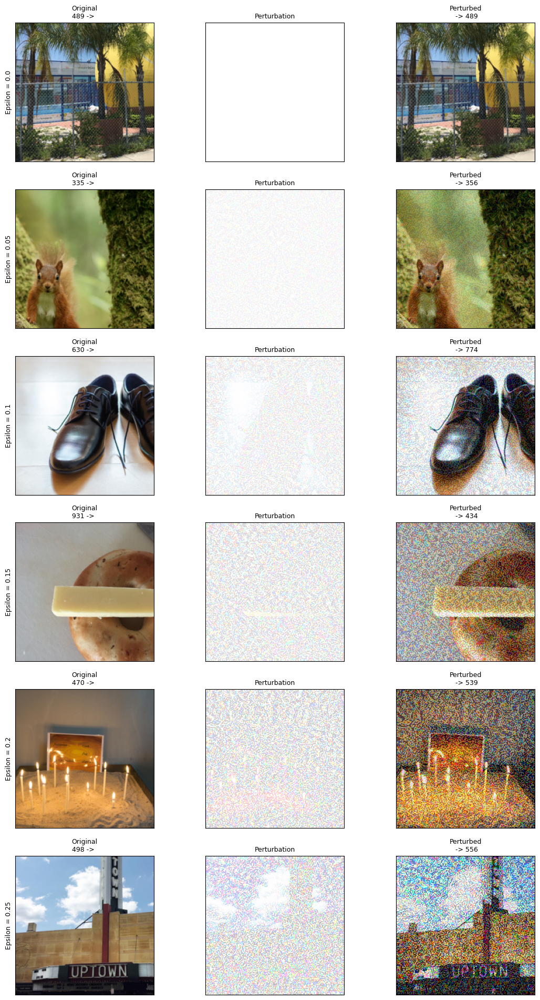

In [ ]:
show_exp(epsilons, examples_r_f1)

Localized and distinguishable perturbations

In [ ]:
# Accuracies for different epsilons of model_resnet with fgsm attack. Epsilon 0.0 means no attack.
#epsilons = [.00, .05, .1, .15, .2, .25]
epsilons2 = [.00, .01, .02, .03, .04, .05]
accuracies_r_f = []
examples_r_f = []
model_resnet.eval()

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_FGSM(model_resnet, device, test_loader_r, eps, targeted = False) #resnet test loader
    accuracies_r_f.append(acc)
    examples_r_f.append(ex)

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.01	Test Accuracy = 420 / 877 = 0.4789053591790194
	Epsilon: 0.02	Test Accuracy = 399 / 877 = 0.4549600912200684
	Epsilon: 0.03	Test Accuracy = 394 / 877 = 0.4492588369441277
	Epsilon: 0.04	Test Accuracy = 384 / 877 = 0.4378563283922463
	Epsilon: 0.05	Test Accuracy = 376 / 877 = 0.42873432155074115


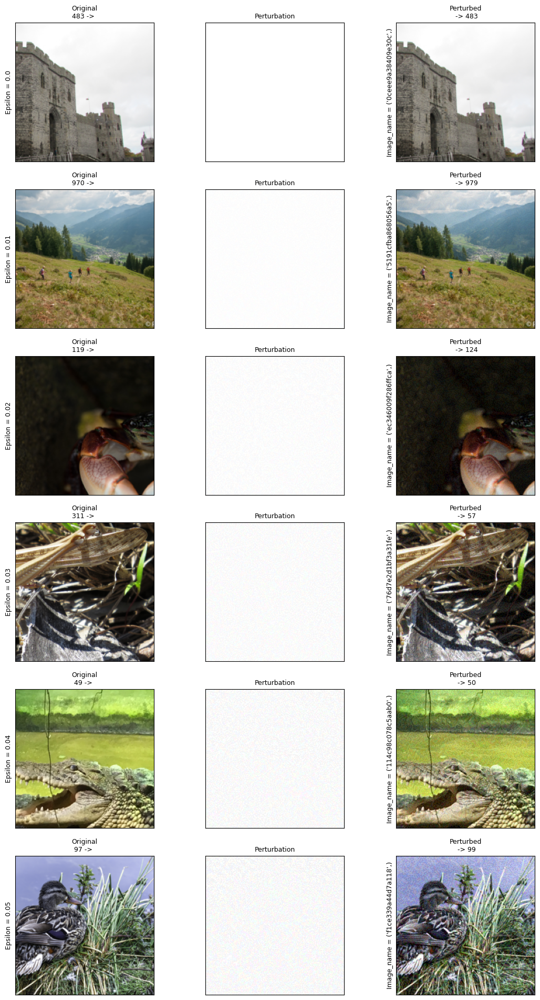

In [ ]:
show_exp(epsilons2, examples_r_f)

#### RESNET - TARGETED

In [ ]:
# Accuracies for different epsilons of model_resnet with fgsm attack. Epsilon 0.0 means no attack.
#19.06.23

accuracies_r_f_t = []
examples_r_f_t = []
model_resnet.eval()

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_FGSM(model_resnet, device, test_loader_r, eps, targeted = True) #resnet test loader
    accuracies_r_f_t.append(acc)
    examples_r_f_t.append(ex)

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.01	Test Accuracy = 719 / 877 = 0.8198403648802737
	Epsilon: 0.02	Test Accuracy = 667 / 877 = 0.7605473204104903
	Epsilon: 0.03	Test Accuracy = 630 / 877 = 0.7183580387685291
	Epsilon: 0.04	Test Accuracy = 605 / 877 = 0.6898517673888256
	Epsilon: 0.05	Test Accuracy = 575 / 877 = 0.6556442417331813




---


#### MOBILENET - NO TARGET

Mobilenet were producing better accuracy results with the attacks, I dont know what changed but, results were more meaningful in Phase2

In [ ]:
# 19.06.23 -
epsilons2 = [.00, .01, .02, .03, .04, .05]
accuracies_m_f = []
examples_m_f = []
model_mobilenet.eval()

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_FGSM(model_mobilenet, device, test_loader_m, eps, targeted = False) #mobilenet test loader
    accuracies_m_f.append(acc)
    examples_m_f.append(ex)

	Epsilon: 0.0	Test Accuracy = 413 / 877 = 0.4709236031927024
	Epsilon: 0.01	Test Accuracy = 18 / 877 = 0.020524515393386546
	Epsilon: 0.02	Test Accuracy = 13 / 877 = 0.014823261117445839
	Epsilon: 0.03	Test Accuracy = 9 / 877 = 0.010262257696693273
	Epsilon: 0.04	Test Accuracy = 7 / 877 = 0.00798175598631699
	Epsilon: 0.05	Test Accuracy = 4 / 877 = 0.004561003420752566


#### MOBILENET - TARGETED

In [ ]:
epsilons2 = [.00, .01, .02, .03, .04, .05]
accuracies_m_f_t = []
examples_m_f_t = []
model_mobilenet.eval()

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_FGSM(model_mobilenet, device, test_loader_m, eps, targeted = True) #mobilenet test loader
    accuracies_m_f_t.append(acc)
    examples_m_f_t.append(ex)


	Epsilon: 0.0	Test Accuracy = 413 / 877 = 0.4709236031927024
	Epsilon: 0.01	Test Accuracy = 184 / 877 = 0.20980615735461802
	Epsilon: 0.02	Test Accuracy = 123 / 877 = 0.1402508551881414
	Epsilon: 0.03	Test Accuracy = 96 / 877 = 0.10946408209806158
	Epsilon: 0.04	Test Accuracy = 85 / 877 = 0.09692132269099202
	Epsilon: 0.05	Test Accuracy = 66 / 877 = 0.07525655644241733




---



#### INCEPTION - NO TARGET

In [ ]:
# Accuracies for different epsilons of model_inception with fgsm attack. Epsilon 0.0 means no attack.
#epsilons = [.00, .05, .1, .15, .2, .25]
accuracies_i_f = []
examples_i_f = []
model_inception.eval()

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_FGSM(model_inception, device, test_loader_i, eps, targeted = False)
    accuracies_i_f.append(acc)
    examples_i_f.append(ex)

	Epsilon: 0.0	Test Accuracy = 526 / 877 = 0.5997719498289624
	Epsilon: 0.01	Test Accuracy = 82 / 877 = 0.09350057012542759
	Epsilon: 0.02	Test Accuracy = 68 / 877 = 0.07753705815279362
	Epsilon: 0.03	Test Accuracy = 57 / 877 = 0.06499429874572406
	Epsilon: 0.04	Test Accuracy = 50 / 877 = 0.05701254275940707
	Epsilon: 0.05	Test Accuracy = 49 / 877 = 0.055872291904218926


#### INCEPTION - TARGETED

In [ ]:
# Accuracies for different epsilons of model_inception with fgsm attack. Epsilon 0.0 means no attack.
#epsilons = [.00, .05, .1, .15, .2, .25]
accuracies_i_f_t = []
examples_i_f_t = []
model_inception.eval()

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_FGSM(model_inception, device, test_loader_i, eps, targeted = True)
    accuracies_i_f_t.append(acc)
    examples_i_f_t.append(ex)

	Epsilon: 0.0	Test Accuracy = 526 / 877 = 0.5997719498289624
	Epsilon: 0.01	Test Accuracy = 290 / 877 = 0.330672748004561
	Epsilon: 0.02	Test Accuracy = 241 / 877 = 0.2748004561003421
	Epsilon: 0.03	Test Accuracy = 217 / 877 = 0.24743443557582667
	Epsilon: 0.04	Test Accuracy = 190 / 877 = 0.21664766248574688
	Epsilon: 0.05	Test Accuracy = 174 / 877 = 0.19840364880273662




---



..

## Basic Iterative Method (BIM)

The Basic Iterative Method (BIM) from Adversarial Examples in the Physical World is a simple extension of the Fast Gradient Sign Method, where instead of taking one large step, it takes an iterative approach by applying FGSM multiple times to an image with step size α, the change in pixel value per iteration.

1. The code iteratively perturbs the input images by taking small steps in the
direction of the gradient.
2. The perturbation is added to the original images using the sign of the gradient multiplied by a small step size.
3. The perturbed images are then clipped and normalized to ensure they remain within a valid range.
4. The iterative process continues for a specified number of steps.

In [10]:
# BIM attack code

"""
- The choice of alpha depends on the scale of the input image and the desired level of perturbation.
- Generally, alpha is a positive real number that is chosen to strike a balance between creating noticeable perturbations and maintaining
the stability of the attack.
- As a starting point, alpha values in the range of 0.01 to 0.1 are commonly used in practice.
- However, it's important to experiment and fine-tune the value to get more stable yet effective attacks

If you find that the perturbations are too subtle and not causing the desired effect, you can increase alpha gradually to observe the impact on
the attack. However, setting alpha as very large values can lead to unstable or divergent perturbations, making the attack ineffective
"""

#eps: maximum perturbation. (Default: 8/255) alpha (float): step size. (Default: 2/255) steps (int): number of steps. (Default: 10)
#eps: maximum perturbation. (Default: 0.1),
#alpha: step size. (Default: 0.04),
#steps (int): number of steps. (Default: 10)

#def BIM(model, images, labels, targets, eps=0.1, alpha=0.04, steps=4, targeted = False):
def BIM(model, images, labels, targets, eps=0.1, alpha=0.015, steps=6, targeted = False):

    def logits(images):
        logits = model(images)
        return logits

    images = images.clone().detach().to(device)
    labels = labels.clone().detach().to(device)
    targets = targets.clone().detach().to(device)

    if targeted:
        target_labels = targets

    loss = nn.CrossEntropyLoss()

    org_images = images.clone().detach()

    for s in range(steps):
        images.requires_grad = True
        outputs = logits(images)

        # Calculate loss
        if targeted:
            cost = -loss(outputs, target_labels)
        else:
            cost = loss(outputs, labels)

        # Update adversarial images
        grad = torch.autograd.grad(cost, images,
                                   retain_graph=False,
                                   create_graph=False)[0]

        """
        Alternatively as in the PGD
        adv_images = images + alpha * grad.sign()
        delta = torch.clamp(adv_images - images, min=-eps, max=eps)
        adv_images = torch.clamp(images + delta, min=0, max=1).detach()
        """

        # Calculate adversarial images by adding the element-wise sign of the gradient multiplied by alpha to the original images.
        adv_images = images + alpha * grad.sign()
        # Clamp the original images to a range of [0, 1] and subtract epsilon (eps).
        a = torch.clamp(org_images - eps, min=0)
        # Compare adv_images with a and create a new tensor b:
            # For each element where adv_images is greater than or equal to a, use adv_images; else use a
        b = (adv_images >= a).float() * adv_images + (adv_images < a).float() * a
        # Compare b with the sum of org_images and eps, and create a new tensor c:
            # For each element where b is greater than org_images + eps, use org_images + eps; else use b
        c = (b > org_images + eps).float() * (org_images + eps) + (b <= org_images + eps).float() * b
        images = torch.clamp(c, max=1).detach()

    return images


In [11]:
# test BIM

def test_BIM( model, device, test_loader, epsilon, targeted = False ):

    # Accuracy counter
    correct = 0
    adv_examples = []
    model.to(device)
    model.eval()

    # Loop over all examples in test set
    for image_name, image, label, target in test_loader:
        # Send the data and label to the device
        image, label, target = image.to(device), label.to(device), target.to(device)

        # Set requires_grad attribute of tensor. Important for Attack
        image.requires_grad = True

        # Forward pass the data through the model
        output = model(image)
        init_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

        # If the initial prediction is wrong, don't bother attacking, just move on
        if (init_pred.item()) != label.item():
            continue

        # Zero all existing gradients
        model.zero_grad()

        # As the attack requires iteration, losses are calculated within the attack function, not once before calling the attack as in the case of FGSM
        # Call BIM Attack
        perturbed_data = BIM(model, image, label, target, eps = epsilon, targeted= targeted)

        # Collect perturbation without applying it to the image
        perturbation = perturbed_data - image
        perturbation = torch.clamp(perturbation, 0, 1)
        pert = perturbation.squeeze().detach().cpu().numpy()

        # Re-classify the perturbed image
        output = model(perturbed_data)

        # Check for success
        final_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

        if (final_pred.item()) == label.item():
            correct += 1
            # Special case for saving 0 epsilon examples
            if (epsilon == 0) and (len(adv_examples) < 5):
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                org = image.squeeze().detach().cpu().numpy()
                #pert = perturbation.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex, image_name, org, pert) )
                #adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )
        else:
            # Save some adv examples for visualization later
            if len(adv_examples) < 5:
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                org = image.squeeze().detach().cpu().numpy()
                #pert = perturbation.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex, image_name, org, pert) )
                #adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )

    # Calculate final accuracy for this epsilon
    final_acc = correct/float(len(test_loader))
    print("\tEpsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(test_loader), final_acc))

    # Return the accuracy and an adversarial example
    return final_acc, adv_examples



---


#### RESNET - NO TARGET

In [ ]:
accuracies_r_b = []
examples_r_b = []
model_resnet.eval()
# Run test for each epsilon
for eps in epsilons:
    acc, ex = test_BIM(model_resnet, device, test_loader_r, eps, targeted = False)
    accuracies_r_b.append(acc)
    examples_r_b.append(ex)

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.05	Test Accuracy = 11 / 877 = 0.012542759407069556
	Epsilon: 0.1	Test Accuracy = 9 / 877 = 0.010262257696693273
	Epsilon: 0.15	Test Accuracy = 9 / 877 = 0.010262257696693273
	Epsilon: 0.2	Test Accuracy = 10 / 877 = 0.011402508551881414
	Epsilon: 0.25	Test Accuracy = 10 / 877 = 0.011402508551881414


In [ ]:
# the output is cleared due to size limit on Github
#show_exp(epsilons, examples_r_b) #alpha 0.015

In [ ]:
epsilons2 = [.00, .01, .02, .03, .04, .05]
accuracies_r_b = []
examples_r_b = []
model_resnet.eval()
# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_BIM(model_resnet, device, test_loader_r, eps, targeted = False)
    accuracies_r_b.append(acc)
    examples_r_b.append(ex)

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.01	Test Accuracy = 134 / 877 = 0.15279361459521096
	Epsilon: 0.02	Test Accuracy = 51 / 877 = 0.05815279361459521
	Epsilon: 0.03	Test Accuracy = 21 / 877 = 0.02394526795895097
	Epsilon: 0.04	Test Accuracy = 17 / 877 = 0.019384264538198404
	Epsilon: 0.05	Test Accuracy = 10 / 877 = 0.011402508551881414


In [ ]:
# the output is cleared due to size limit on Github
#show_exp(epsilons2, examples_r_b) #alpha 0.015

#### RESNET - TARGETED

In [ ]:
accuracies_r_b_t = []
examples_r_b_t = []
model_resnet.eval()
# Run test for each epsilon
for eps in epsilons:
    acc, ex = test_BIM(model_resnet, device, test_loader_r, eps, targeted = True)
    accuracies_r_b_t.append(acc)
    examples_r_b_t.append(ex)

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.05	Test Accuracy = 64 / 877 = 0.07297605473204105
	Epsilon: 0.1	Test Accuracy = 44 / 877 = 0.05017103762827822
	Epsilon: 0.15	Test Accuracy = 44 / 877 = 0.05017103762827822
	Epsilon: 0.2	Test Accuracy = 45 / 877 = 0.05131128848346636
	Epsilon: 0.25	Test Accuracy = 46 / 877 = 0.052451539338654506


In [ ]:
# the output is cleared due to size limit on Github
# show_exp(epsilons, examples_r_b_t) #alpha 0.015



---



In [ ]:
accuracies_r_b_t = []
examples_r_b_t = []
model_resnet.eval()
# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_BIM(model_resnet, device, test_loader_r, eps, targeted = True)
    accuracies_r_b_t.append(acc)
    examples_r_b_t.append(ex)

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.01	Test Accuracy = 632 / 877 = 0.7206385404789054
	Epsilon: 0.02	Test Accuracy = 243 / 877 = 0.27708095781071834
	Epsilon: 0.03	Test Accuracy = 125 / 877 = 0.14253135689851767
	Epsilon: 0.04	Test Accuracy = 86 / 877 = 0.09806157354618016
	Epsilon: 0.05	Test Accuracy = 63 / 877 = 0.07183580387685291


In [ ]:
# the output is cleared due to size limit on Github
#show_exp(epsilons2, examples_r_b_t) #alpha 0.015

#### MOBILENET - NO TARGET

In [ ]:
accuracies_m_b = []
examples_m_b = []
model_mobilenet.eval()
# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_BIM(model_mobilenet, device, test_loader_m, eps, targeted = False)
    accuracies_m_b.append(acc)
    examples_m_b.append(ex)

	Epsilon: 0.0	Test Accuracy = 413 / 877 = 0.4709236031927024
	Epsilon: 0.01	Test Accuracy = 0 / 877 = 0.0
	Epsilon: 0.02	Test Accuracy = 0 / 877 = 0.0
	Epsilon: 0.03	Test Accuracy = 0 / 877 = 0.0
	Epsilon: 0.04	Test Accuracy = 0 / 877 = 0.0
	Epsilon: 0.05	Test Accuracy = 0 / 877 = 0.0


#### MOBILENET - TARGETED

In [ ]:
accuracies_m_b_t = []
examples_m_b_t = []
model_mobilenet.eval()
# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_BIM(model_mobilenet, device, test_loader_m, eps, targeted = True)
    accuracies_m_b_t.append(acc)
    examples_m_b_t.append(ex)

	Epsilon: 0.0	Test Accuracy = 413 / 877 = 0.4709236031927024
	Epsilon: 0.01	Test Accuracy = 218 / 877 = 0.24857468643101482
	Epsilon: 0.02	Test Accuracy = 15 / 877 = 0.01710376282782212
	Epsilon: 0.03	Test Accuracy = 2 / 877 = 0.002280501710376283
	Epsilon: 0.04	Test Accuracy = 1 / 877 = 0.0011402508551881414
	Epsilon: 0.05	Test Accuracy = 0 / 877 = 0.0




---



#### INCEPTION - NO TARGET

In [ ]:
accuracies_i_b = []
examples_i_b = []
model_inception.eval()
# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_BIM(model_inception, device, test_loader_i, eps, targeted = False)
    accuracies_i_b.append(acc)
    examples_i_b.append(ex)

	Epsilon: 0.0	Test Accuracy = 526 / 877 = 0.5997719498289624
	Epsilon: 0.01	Test Accuracy = 21 / 877 = 0.02394526795895097
	Epsilon: 0.02	Test Accuracy = 1 / 877 = 0.0011402508551881414
	Epsilon: 0.03	Test Accuracy = 0 / 877 = 0.0
	Epsilon: 0.04	Test Accuracy = 0 / 877 = 0.0
	Epsilon: 0.05	Test Accuracy = 0 / 877 = 0.0


####INCEPTION - TARGETED

In [ ]:
accuracies_i_b_t = []
examples_i_b_t = []
model_inception.eval()
# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_BIM(model_inception, device, test_loader_i, eps, targeted = True)
    accuracies_i_b_t.append(acc)
    examples_i_b_t.append(ex)

	Epsilon: 0.0	Test Accuracy = 526 / 877 = 0.5997719498289624
	Epsilon: 0.01	Test Accuracy = 277 / 877 = 0.31584948688711517
	Epsilon: 0.02	Test Accuracy = 108 / 877 = 0.12314709236031927
	Epsilon: 0.03	Test Accuracy = 57 / 877 = 0.06499429874572406
	Epsilon: 0.04	Test Accuracy = 32 / 877 = 0.036488027366020526
	Epsilon: 0.05	Test Accuracy = 32 / 877 = 0.036488027366020526





---


## Projected Gradient Descent (PGD)


The Projected Gradient Descent (PGD) is also a simple extension of the Fast Gradient Sign Method, where instead of taking one large step, it takes an iterative approach by applying FGSM multiple times to an image with step size α, the change in pixel value per iteration. From this point of view, it is completely same with BIM, however the main difference between PGD and BIM is that, in BIM the initial adversarial image is the original image itself whereas; In PGD, the initial adversarial image is a random point in the epsilon ball around the original image.

1. This algorithm also performs an iterative perturbation of the input images.
2. However, instead of directly perturbing the original images, it initializes the adversarial images with a random point in the epsilon ball around the original images.
3. The perturbation is added to the adversarial images using the sign of the gradient multiplied by a small step size.
4. After each perturbation, the adversarial images are clipped and normalized to ensure they remain within a valid range.
5. The iterative process continues for a specified number of steps.

In [12]:
# PGD attack code
import torch

#def PGD(model, images, labels, targets, eps=0.1, alpha=0.015, steps=4, targeted = False):
def PGD(model, images, labels, targets, eps=0.05, alpha=0.015, steps=4, targeted = False):

    def logits(images):
        logits = model(images)
        return logits

    images = images.clone().detach().to(device)
    labels = labels.clone().detach().to(device)
    targets = targets.clone().detach().to(device)

    if targeted:
        target_labels = targets

    loss = nn.CrossEntropyLoss()

    adv_images = images.clone().detach()

    #RANDOM POINT
    adv_images = adv_images + torch.empty_like(adv_images).uniform_(-eps, eps)
    adv_images = torch.clamp(adv_images, min=0, max=1).detach()

    for s in range(steps):
        adv_images.requires_grad = True
        outputs = logits(adv_images)

        # Calculate loss
        if targeted:
            cost = -loss(outputs, target_labels)
        else:
            cost = loss(outputs, labels)

        # Update adversarial images
        grad = torch.autograd.grad(cost, adv_images,
                                   retain_graph=False,
                                   create_graph=False)[0]

        adv_images = adv_images + alpha * grad.sign()
        #a = torch.clamp(org_images - eps, min=0)
        #b = (adv_images >= a).float() * adv_images + (adv_images < a).float() * a #DELTA
        delta = torch.clamp(adv_images - images, min=-eps, max=eps)
        adv_images = torch.clamp(images + delta, min=0, max=1).detach()

    return adv_images


In [13]:

def test_PGD( model, device, test_loader, epsilon, targeted ):

    # Accuracy counter
    correct = 0
    adv_examples = []
    model.eval()

    # Loop over all examples in test set
    for image_name, image, label, target in test_loader:

        # Send the image, label and target to the device
        image, label, target = image.to(device), label.to(device), target.to(device)

        # Set requires_grad attribute of tensor. Important for Attack
        image.requires_grad = True

        # Forward pass the data through the model
        output = model(image)
        init_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

        # If the initial prediction is wrong, don't bother attacking, just move on
        if (init_pred.item()) != label.item():
            continue

        # Zero all existing gradients
        model.zero_grad()

        # Call BIM Attack
        perturbed_data = PGD(model, image, label, target, eps = epsilon, targeted= targeted) #fgsm_attack(data, epsilon, data_grad)

        # Collect perturbation without applying it to the image
        perturbation = perturbed_data - image
        perturbation = torch.clamp(perturbation, 0, 1)
        pert = perturbation.squeeze().detach().cpu().numpy()


        # As the attack requires iteration, losses are calculated within the attack function, not once before calling the attack as in the case of FGSM
        # Re-classify the perturbed image
        output = model(perturbed_data)

        # Check for success
        final_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

        if (final_pred.item()) == label.item():
            correct += 1
            # Special case for saving 0 epsilon examples
            if (epsilon == 0) and (len(adv_examples) < 5):
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                org = image.squeeze().detach().cpu().numpy()
                #pert = perturbation.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex, image_name, org, pert) )
                #adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )
        else:
            # Save some adv examples for visualization later
            if len(adv_examples) < 5:
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                org = image.squeeze().detach().cpu().numpy()
                #pert = perturbation.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex, image_name, org, pert) )
                #adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )

    # Calculate final accuracy for this epsilon
    final_acc = correct/float(len(test_loader))
    print("\tEpsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(test_loader), final_acc))

    # Return the accuracy and an adversarial example
    return final_acc, adv_examples

#### RESNET - NO TARGET

In [ ]:
accuracies_r_p = [] #alpha 0.015
examples_r_p = []
model_resnet.eval()
# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_PGD(model_resnet, device, test_loader_r, eps, targeted = False)
    accuracies_r_p.append(acc)
    examples_r_p.append(ex)

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.01	Test Accuracy = 170 / 877 = 0.19384264538198404
	Epsilon: 0.02	Test Accuracy = 83 / 877 = 0.09464082098061574
	Epsilon: 0.03	Test Accuracy = 54 / 877 = 0.06157354618015964
	Epsilon: 0.04	Test Accuracy = 34 / 877 = 0.03876852907639681
	Epsilon: 0.05	Test Accuracy = 31 / 877 = 0.03534777651083238


In [ ]:
# the output is cleared due to size limit on Github
#show_exp(epsilons2, examples_r_p) #alpha 0.015

#### RESNET - TARGETED

In [ ]:
#18.06.23
#20.06.23

accuracies_r_p_t = []
examples_r_p_t = []
model_resnet.eval()
# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_PGD(model_resnet, device, test_loader_r, eps, targeted = True)
    accuracies_r_p_t.append(acc)
    examples_r_p_t.append(ex)

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.01	Test Accuracy = 668 / 877 = 0.7616875712656784
	Epsilon: 0.02	Test Accuracy = 371 / 877 = 0.42303306727480045
	Epsilon: 0.03	Test Accuracy = 247 / 877 = 0.28164196123147095
	Epsilon: 0.04	Test Accuracy = 185 / 877 = 0.21094640820980615
	Epsilon: 0.05	Test Accuracy = 151 / 877 = 0.17217787913340935




---



#### MOBILENET - NO TARGET

In [ ]:
accuracies_m_p = []
examples_m_p = []
model_mobilenet.eval()
# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_PGD(model_mobilenet, device, test_loader_m, eps, targeted = False)
    accuracies_m_p.append(acc)
    examples_m_p.append(ex)

	Epsilon: 0.0	Test Accuracy = 413 / 877 = 0.4709236031927024
	Epsilon: 0.01	Test Accuracy = 1 / 877 = 0.0011402508551881414
	Epsilon: 0.02	Test Accuracy = 0 / 877 = 0.0
	Epsilon: 0.03	Test Accuracy = 0 / 877 = 0.0
	Epsilon: 0.04	Test Accuracy = 0 / 877 = 0.0
	Epsilon: 0.05	Test Accuracy = 0 / 877 = 0.0


#### MOBILENET - TARGETED

In [ ]:
accuracies_m_p = []
examples_m_p = []
model_mobilenet.eval()
# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_PGD(model_mobilenet, device, test_loader_m, eps, targeted = True)
    accuracies_m_p.append(acc)
    examples_m_p.append(ex)

	Epsilon: 0.0	Test Accuracy = 413 / 877 = 0.4709236031927024
	Epsilon: 0.01	Test Accuracy = 248 / 877 = 0.28278221208665905
	Epsilon: 0.02	Test Accuracy = 29 / 877 = 0.0330672748004561
	Epsilon: 0.03	Test Accuracy = 6 / 877 = 0.0068415051311288486
	Epsilon: 0.04	Test Accuracy = 5 / 877 = 0.005701254275940707
	Epsilon: 0.05	Test Accuracy = 3 / 877 = 0.0034207525655644243


#### INCEPTION - NO TARGET

In [ ]:
accuracies_i_p = []
examples_i_p = []
model_inception.eval()
# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_PGD(model_inception, device, test_loader_i, eps, targeted = False)
    accuracies_i_p.append(acc)
    examples_i_p.append(ex)

	Epsilon: 0.0	Test Accuracy = 526 / 877 = 0.5997719498289624
	Epsilon: 0.01	Test Accuracy = 29 / 877 = 0.0330672748004561
	Epsilon: 0.02	Test Accuracy = 3 / 877 = 0.0034207525655644243
	Epsilon: 0.03	Test Accuracy = 4 / 877 = 0.004561003420752566
	Epsilon: 0.04	Test Accuracy = 1 / 877 = 0.0011402508551881414
	Epsilon: 0.05	Test Accuracy = 1 / 877 = 0.0011402508551881414




---


#### INCEPTION - TARGETED

In [ ]:
accuracies_i_p = []
examples_i_p = []
model_inception.eval()
# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_PGD(model_inception, device, test_loader_i, eps, targeted = True)
    accuracies_i_p.append(acc)
    examples_i_p.append(ex)

	Epsilon: 0.0	Test Accuracy = 526 / 877 = 0.5997719498289624
	Epsilon: 0.01	Test Accuracy = 295 / 877 = 0.3363740022805017
	Epsilon: 0.02	Test Accuracy = 133 / 877 = 0.1516533637400228
	Epsilon: 0.03	Test Accuracy = 66 / 877 = 0.07525655644241733
	Epsilon: 0.04	Test Accuracy = 61 / 877 = 0.06955530216647662
	Epsilon: 0.05	Test Accuracy = 56 / 877 = 0.06385404789053592


# **DEFENSE**

I've tried 3 defense algorithms for performance improvement which are feature squeezing, input normalization and spatial smoothing, with different hyperparameters. However, I dont see the expected improvements on the results.

### FEATURE SQUEEZING

In [20]:
import torch
import torch.nn.functional as F

# Feature Squeezing function
def feature_squeezing(image, bit_depth=4):
    # Apply feature squeezing by reducing the precision of the image
    image = image * (2*bit_depth - 1)
    image = torch.round(image) / (2*bit_depth - 1)
    return image

"""
For reducing to i-bit depth (1 ≤ i ≤ 7), we first multiply the input value with 2i − 1 (minus 1 due to the zero value)
then round to integers. Next we scale the integers back to [0, 1], divided by 2i − 1.
The information capacity of the representation is reduced from 8-bit to i-bit with the integer-rounding operation.

"""

def test_fgsm_feature_squeezing( model, device, loader, epsilon, targeted = False):

    # Accuracy counter
    correct = 0
    adv_examples = []
    #model.to(device)
    model.eval()

    # Loop over all examples in test set
    for image_name, image, label, target in loader:
      # Send the data and label to the device
        image = image.to(device)
        label = label.to(device)
        target = target.to(device)

        # Set requires_grad attribute of tensor. Important for Attack
        image.requires_grad = True #bu grad train etmeden olmuyor herhalde
        #print(image)
        # Forward pass the data through the model
        output = model(image)
        init_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

        # If the initial prediction is wrong, don't bother attacking, just move on - SO DONT BOTHER DEFENSING OFC
        if (init_pred.item()) != label.item():
            model.zero_grad()
            continue

        if targeted == True :
            loss = - (F.nll_loss(output, target))
        else :
            loss = F.nll_loss(output, label)
        # Zero all existing gradients
        model.zero_grad()

        # Calculate gradients of model in backward pass
        loss.backward(retain_graph=True) #retain_graph=True

        # Collect ``datagrad``
        data_grad = image.grad.data

        # Call FGSM Attack
        perturbed_data = fgsm_attack(image, epsilon, data_grad)

        # Apply Feature Squeezing
        squeezed_image = feature_squeezing(perturbed_data)

        # Classify the squeezed image
        output = model(squeezed_image)

        perturbation = perturbed_data - image
        perturbation = torch.clamp(perturbation, 0, 1)
        pert = perturbation.squeeze().detach().cpu().numpy()

        s_perturbation = squeezed_image - image
        s_perturbation = torch.clamp(s_perturbation, 0, 1)
        s_pert = s_perturbation.squeeze().detach().cpu().numpy()

        pert_label = (model(perturbed_data)).max(1, keepdim=True)[1]
        # Check for success
        final_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability
        #final_pred2 = defend_output.max(1, keepdim=True)[1] # get the index of the max log-probability

        if (final_pred.item()) == label.item():
            correct += 1
            # Special case for saving 0 epsilon examples
            if (epsilon == 0) and (len(adv_examples) < 5):
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                org = image.squeeze().detach().cpu().numpy()
                def_adv_ex = squeezed_image.squeeze().detach().cpu().numpy()
                #pert = perturbation.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex, image_name, org, pert, s_pert, def_adv_ex, pert_label.item()) )
                #adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )
            elif (epsilon > 0) and (pert_label.item() != label.item()):
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                org = image.squeeze().detach().cpu().numpy()
                def_adv_ex = squeezed_image.squeeze().detach().cpu().numpy()
                #pert = perturbation.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex, image_name, org, pert,s_pert, def_adv_ex, pert_label.item()) )
    # Calculate final accuracy for this epsilon
    final_acc = correct/float(len(loader))
    print("\tEpsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(loader), final_acc))

    # Return the accuracy and an adversarial example
    return final_acc, adv_examples





In [15]:
# test BIM

def test_BIM_d( model, device, test_loader, epsilon, targeted =False ):

    # Accuracy counter
    correct = 0
    adv_examples = []
    model.to(device)
    model.eval()

    # Loop over all examples in test set
    for image_name, image, label, target in test_loader:
        # Send the data and label to the device
        image, label, target = image.to(device), label.to(device), target.to(device)

        # Set requires_grad attribute of tensor. Important for Attack
        image.requires_grad = True

        # Forward pass the data through the model
        output = model(image)
        init_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

        # If the initial prediction is wrong, don't bother attacking, just move on
        if (init_pred.item()) != label.item():
            model.zero_grad()
            continue

        # Zero all existing gradients
        model.zero_grad()

        # As the attack requires iteration, losses are calculated within the attack function, not once before calling the attack as in the case of FGSM
        # Call BIM Attack
        perturbed_data = BIM(model, image, label, target, eps = epsilon, targeted= targeted)

        # Re-classify the perturbed image
        #output = model(perturbed_data)

        # Apply Feature Squeezing
        squeezed_image = feature_squeezing(perturbed_data)

        perturbation = perturbed_data - image
        perturbation = torch.clamp(perturbation, 0, 1)
        pert = perturbation.squeeze().detach().cpu().numpy()

        s_perturbation = squeezed_image - image
        s_perturbation = torch.clamp(s_perturbation, 0, 1)
        s_pert = s_perturbation.squeeze().detach().cpu().numpy()

        pert_label = (model(perturbed_data)).max(1, keepdim=True)[1]

        # Classify the squeezed image
        output = model(squeezed_image)

        # Check for success
        final_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

        if (final_pred.item()) == label.item():
            correct += 1
            # Special case for saving 0 epsilon examples
            if (epsilon == 0) and (len(adv_examples) < 5):
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                org = image.squeeze().detach().cpu().numpy()
                def_adv_ex = squeezed_image.squeeze().detach().cpu().numpy()
                #pert = perturbation.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex, image_name, org, pert, s_pert, def_adv_ex, pert_label.item()) )
                #adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )
            elif ((epsilon > 0) and (pert_label.item() != label.item()) and (len(adv_examples) < 5)):
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                org = image.squeeze().detach().cpu().numpy()
                def_adv_ex = squeezed_image.squeeze().detach().cpu().numpy()
                #pert = perturbation.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex, image_name, org, pert,s_pert, def_adv_ex, pert_label.item()) )


    # Calculate final accuracy for this epsilon
    final_acc = correct/float(len(test_loader))
    print("\tEpsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(test_loader), final_acc))

    # Return the accuracy and an adversarial example
    return final_acc, adv_examples

In [16]:

def test_PGD_d( model, device, test_loader, epsilon, targeted =False):

    # Accuracy counter
    correct = 0
    adv_examples = []
    model.eval()

    # Loop over all examples in test set
    for image_name, image, label, target in test_loader:

        # Send the image, label and target to the device
        image, label, target = image.to(device), label.to(device), target.to(device)

        # Set requires_grad attribute of tensor. Important for Attack
        image.requires_grad = True

        # Forward pass the data through the model
        output = model(image)
        init_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

        # If the initial prediction is wrong, don't bother attacking, just move on
        if (init_pred.item()) != label.item():
            continue

        # Zero all existing gradients
        model.zero_grad()

        # Call BIM Attack
        perturbed_data = PGD(model, image, label, target, eps = epsilon, targeted= targeted) #fgsm_attack(data, epsilon, data_grad)

        # Apply Feature Squeezing
        squeezed_image = feature_squeezing(perturbed_data)

        perturbation = perturbed_data - image
        perturbation = torch.clamp(perturbation, 0, 1)
        pert = perturbation.squeeze().detach().cpu().numpy()

        s_perturbation = squeezed_image - image
        s_perturbation = torch.clamp(s_perturbation, 0, 1)
        s_pert = s_perturbation.squeeze().detach().cpu().numpy()

        pert_label = (model(perturbed_data)).max(1, keepdim=True)[1]

        # Classify the squeezed image
        output = model(squeezed_image)

        # Check for success
        final_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

        if (final_pred.item()) == label.item():
            correct += 1
            # Special case for saving 0 epsilon examples
            if (epsilon == 0) and (len(adv_examples) < 5):
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                org = image.squeeze().detach().cpu().numpy()
                def_adv_ex = squeezed_image.squeeze().detach().cpu().numpy()
                #pert = perturbation.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex, image_name, org, pert, s_pert, def_adv_ex, pert_label.item()) )
                #adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )
            elif ((epsilon > 0) and (pert_label.item() != label.item()) and (len(adv_examples) < 5)):
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                org = image.squeeze().detach().cpu().numpy()
                def_adv_ex = squeezed_image.squeeze().detach().cpu().numpy()
                #pert = perturbation.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex, image_name, org, pert,s_pert, def_adv_ex, pert_label.item()) )

    # Calculate final accuracy for this epsilon
    final_acc = correct/float(len(test_loader))
    print("\tEpsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(test_loader), final_acc))

    # Return the accuracy and an adversarial example
    return final_acc, adv_examples

In [17]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def show_exp_def(epsilons, examples):
    if not examples:
        print("Error: Empty examples list.")
        return

    num_examples = len(examples[0])
    num_epsilons = len(epsilons)
    fig, axs = plt.subplots(num_epsilons, 4, figsize=(20, num_epsilons * 4), facecolor='white')
    plt.subplots_adjust(wspace=0.01, hspace=0.2)

    for i, epsilon_examples in enumerate(examples):
        epsilon = epsilons[i]

        if not epsilon_examples:
            print("Warning: Empty epsilon_examples list at index", i)
            for j in range(4):
                axs[i, j].set_visible(False)
            continue

        try:
            orig_label, adv_label, ex, name, org, pert, s_pert, def_adv_ex, pert_label = epsilon_examples[0]
        except IndexError:
            print("Warning: Insufficient elements in epsilon_examples list at index", i)
            for j in range(4):
                axs[i, j].set_visible(False)
            continue

        # invert perturbation
        pert = 1 - pert #so that they wont seem dark but white

        ax1 = axs[i, 0]
        ax1.set_xticks([])
        ax1.set_yticks([])
        ax1.set_title("Original\n{} -> ".format(orig_label), fontsize=9)
        ax1.imshow(org.transpose(1, 2, 0))
        ax1.set_ylabel("Epsilon = {}".format(epsilon), fontsize=9)

        ax2 = axs[i, 1]
        ax2.set_xticks([])
        ax2.set_yticks([])
        ax2.set_title("Perturbation", fontsize=9)
        ax2.imshow(pert.transpose(1, 2, 0), cmap=cm.jet)

        ax3 = axs[i, 2]
        ax3.set_xticks([])
        ax3.set_yticks([])
        ax3.set_title("Perturbed\n -> {}".format(pert_label), fontsize=9)
        ax3.imshow(ex.transpose(1, 2, 0))

        ax4 = axs[i, 3]
        ax4.set_xticks([])
        ax4.set_yticks([])
        ax4.set_title("Defensed Perturbed\n -> {}".format(adv_label), fontsize=9)
        ax4.imshow(def_adv_ex.transpose(1, 2, 0))

    # Hide unused subplots
    if num_epsilons > len(examples):
        for i in range(len(examples), num_epsilons):
            for j in range(4):
                axs[i, j].set_visible(False)

    plt.show()



### RESNET - FGSM - FEATURE SQUEEZING - NONTARGETED

Original nontargeted FGSM attack performance on RESNET (with higher range epsilons)

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.05	Test Accuracy = 376 / 877 = 0.42873432155074115
	Epsilon: 0.1	Test Accuracy = 284 / 877 = 0.3238312428734322
	Epsilon: 0.15	Test Accuracy = 167 / 877 = 0.1904218928164196
	Epsilon: 0.2	Test Accuracy = 97 / 877 = 0.11060433295324971
	Epsilon: 0.25	Test Accuracy = 59 / 877 = 0.06727480045610035

In [ ]:
#18.06.23
epsilons = [.00, .05, .1, .15, .2, .25]
accuracies_r_f_dsq = []
examples_r_f_dsq = []
model_resnet.eval()

# Run test for each epsilon
for eps in epsilons:
    #acc, ex =
    acc,ex = test_fgsm_feature_squeezing(model_resnet, device, test_loader_r, eps)
    accuracies_r_f_dsq.append(acc)
    examples_r_f_dsq.append(ex)

	Epsilon: 0.0	Test Accuracy = 780 / 877 = 0.8893956670467503
	Epsilon: 0.05	Test Accuracy = 416 / 877 = 0.47434435575826683
	Epsilon: 0.1	Test Accuracy = 288 / 877 = 0.32839224629418473
	Epsilon: 0.15	Test Accuracy = 179 / 877 = 0.20410490307867732
	Epsilon: 0.2	Test Accuracy = 102 / 877 = 0.11630558722919042
	Epsilon: 0.25	Test Accuracy = 62 / 877 = 0.07069555302166476


In [ ]:
# the output is cleared due to size limit on Github
#show_exp_def(epsilons, examples_r_f_dsq)

..

Original nontargeted FGSM attack performance on RESNET (with lower range epsilons)

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.01	Test Accuracy = 420 / 877 = 0.4789053591790194
	Epsilon: 0.02	Test Accuracy = 399 / 877 = 0.4549600912200684
	Epsilon: 0.03	Test Accuracy = 394 / 877 = 0.4492588369441277
	Epsilon: 0.04	Test Accuracy = 384 / 877 = 0.4378563283922463
	Epsilon: 0.05	Test Accuracy = 376 / 877 = 0.42873432155074115

In [ ]:
#epsilons = [.00, .05, .1, .15, .2, .25]
accuracies_r_f_dsq = []
examples_r_f_dsq = []
model_resnet.eval()

# Run test for each epsilon
for eps in epsilons2:
    #acc, ex =
    acc,ex = test_fgsm_feature_squeezing(model_resnet, device, test_loader_r, eps)
    accuracies_r_f_dsq.append(acc)
    examples_r_f_dsq.append(ex)

	Epsilon: 0.0	Test Accuracy = 780 / 877 = 0.8893956670467503
	Epsilon: 0.01	Test Accuracy = 567 / 877 = 0.6465222348916762
	Epsilon: 0.02	Test Accuracy = 487 / 877 = 0.5553021664766249
	Epsilon: 0.03	Test Accuracy = 463 / 877 = 0.5279361459521095
	Epsilon: 0.04	Test Accuracy = 442 / 877 = 0.5039908779931584
	Epsilon: 0.05	Test Accuracy = 416 / 877 = 0.47434435575826683


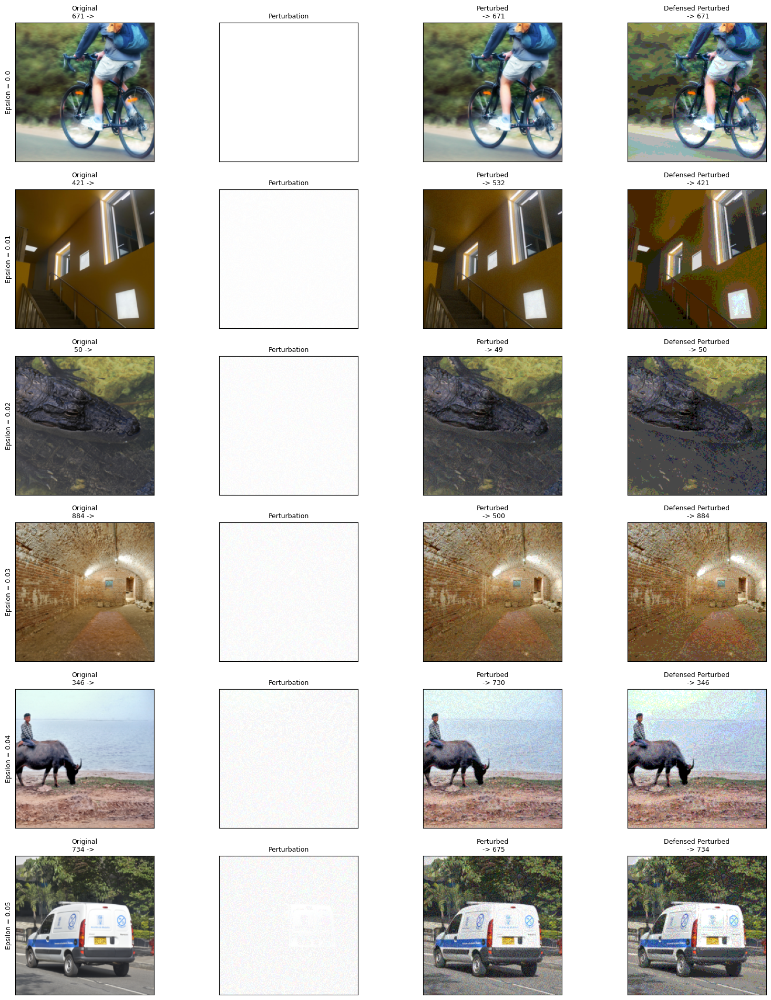

In [ ]:
#20.06.23
show_exp_def(epsilons2, examples_r_f_dsq)

### RESNET - FGSM - FEATURE SQUEEZING - TARGETED


Original targeted FGSM attack performance on RESNET (with lower range epsilons)

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.01	Test Accuracy = 719 / 877 = 0.8198403648802737
	Epsilon: 0.02	Test Accuracy = 667 / 877 = 0.7605473204104903
	Epsilon: 0.03	Test Accuracy = 630 / 877 = 0.7183580387685291
	Epsilon: 0.04	Test Accuracy = 605 / 877 = 0.6898517673888256
	Epsilon: 0.05	Test Accuracy = 575 / 877 = 0.6556442417331813

In [ ]:
epsilons = [.00, .05, .1, .15, .2, .25]
accuracies_r_f_dsq_t = []
examples_r_f_dsq_t = []
model_resnet.eval()

# Run test for each epsilon
for eps in epsilons2:
    #acc, ex =
    acc,ex = test_fgsm_feature_squeezing(model_resnet, device, test_loader_r, eps, targeted = True)
    accuracies_r_f_dsq_t.append(acc)
    examples_r_f_dsq_t.append(ex)

	Epsilon: 0.0	Test Accuracy = 780 / 877 = 0.8893956670467503
	Epsilon: 0.01	Test Accuracy = 754 / 877 = 0.8597491448118586
	Epsilon: 0.02	Test Accuracy = 702 / 877 = 0.8004561003420753
	Epsilon: 0.03	Test Accuracy = 661 / 877 = 0.7537058152793614
	Epsilon: 0.04	Test Accuracy = 617 / 877 = 0.7035347776510832
	Epsilon: 0.05	Test Accuracy = 585 / 877 = 0.6670467502850627


### MOBILENET - FGSM - FEATURE SQUEEZING (NON TARGETED)

Original nontargeted FGSM attack performance on MOBILENET (with lower range epsilons)

	Epsilon: 0.0	Test Accuracy = 413 / 877 = 0.4709236031927024
	Epsilon: 0.01	Test Accuracy = 18 / 877 = 0.020524515393386546
	Epsilon: 0.02	Test Accuracy = 13 / 877 = 0.014823261117445839
	Epsilon: 0.03	Test Accuracy = 9 / 877 = 0.010262257696693273
	Epsilon: 0.04	Test Accuracy = 7 / 877 = 0.00798175598631699
	Epsilon: 0.05	Test Accuracy = 4 / 877 = 0.004561003420752566

In [ ]:
accuracies_m_f_dsq = []
examples_m_f_dsq = []
model_mobilenet.eval()

# Run test for each epsilon
for eps in epsilons2:
    #acc, ex =
    acc = test_fgsm_feature_squeezing(model_mobilenet, device, test_loader_m, eps)
    accuracies_m_f_dsq.append(acc)
    #examples_r_f_d.append(ex)

	Epsilon: 0.0	Test Accuracy = 307 / 877 = 0.3500570125427594
	Epsilon: 0.01	Test Accuracy = 57 / 877 = 0.06499429874572406
	Epsilon: 0.02	Test Accuracy = 21 / 877 = 0.02394526795895097
	Epsilon: 0.03	Test Accuracy = 16 / 877 = 0.018244013683010263
	Epsilon: 0.04	Test Accuracy = 10 / 877 = 0.011402508551881414
	Epsilon: 0.05	Test Accuracy = 10 / 877 = 0.011402508551881414


### MOBILENET - FGSM - FUTURE SQUEEZING (TARGETED)

In [21]:
accuracies_m_f_d_t = []
examples_m_f_d_t = []

epsilons2 = [.00, .01, .02, .03, .04, .05]

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_fgsm_feature_squeezing(model_mobilenet, device, test_loader_m, eps, targeted = True)
    accuracies_m_f_d_t.append(acc)
    examples_m_f_d_t.append(ex)

	Epsilon: 0.0	Test Accuracy = 307 / 877 = 0.3500570125427594
	Epsilon: 0.01	Test Accuracy = 223 / 877 = 0.2542759407069555
	Epsilon: 0.02	Test Accuracy = 150 / 877 = 0.17103762827822122
	Epsilon: 0.03	Test Accuracy = 110 / 877 = 0.12542759407069556
	Epsilon: 0.04	Test Accuracy = 84 / 877 = 0.09578107183580388
	Epsilon: 0.05	Test Accuracy = 62 / 877 = 0.07069555302166476


...

### RESNET - BIM - FEATURE SQUEEZING

Original BIM attack accuracies on RESNET

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.05	Test Accuracy = 11 / 877 = 0.012542759407069556
	Epsilon: 0.1	Test Accuracy = 9 / 877 = 0.010262257696693273
	Epsilon: 0.15	Test Accuracy = 9 / 877 = 0.010262257696693273
	Epsilon: 0.2	Test Accuracy = 10 / 877 = 0.011402508551881414
	Epsilon: 0.25	Test Accuracy = 10 / 877 = 0.011402508551881414

In [ ]:
accuracies_r_b_d = []
examples_r_b_d = []

model_resnet = torch.hub.load("pytorch/vision", "resnet50", weights="IMAGENET1K_V2")
model_resnet = model_resnet.to(device)
model_resnet.eval()

# Run test for each epsilon
for eps in epsilons:
    #acc, ex =
    acc, ex = test_BIM_d(model_resnet, device, test_loader_r, eps)
    accuracies_r_b_d.append(acc)
    examples_r_b_d.append(ex)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


	Epsilon: 0.0	Test Accuracy = 780 / 877 = 0.8893956670467503
	Epsilon: 0.05	Test Accuracy = 36 / 877 = 0.04104903078677309
	Epsilon: 0.1	Test Accuracy = 20 / 877 = 0.02280501710376283
	Epsilon: 0.15	Test Accuracy = 20 / 877 = 0.02280501710376283
	Epsilon: 0.2	Test Accuracy = 21 / 877 = 0.02394526795895097
	Epsilon: 0.25	Test Accuracy = 20 / 877 = 0.02280501710376283


In [ ]:
# the output is cleared due to size limit on Github
#show_exp_def(epsilons, examples_r_b_d) #alpha 0.015

..

Original nontargeted BIM attack performance on RESNET (with lower range epsilons)

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.01	Test Accuracy = 134 / 877 = 0.15279361459521096
	Epsilon: 0.02	Test Accuracy = 51 / 877 = 0.05815279361459521
	Epsilon: 0.03	Test Accuracy = 21 / 877 = 0.02394526795895097
	Epsilon: 0.04	Test Accuracy = 17 / 877 = 0.019384264538198404
	Epsilon: 0.05	Test Accuracy = 10 / 877 = 0.011402508551881414

In [ ]:
accuracies_r_b_d = []
examples_r_b_d = []

model_resnet = torch.hub.load("pytorch/vision", "resnet50", weights="IMAGENET1K_V2")
model_resnet = model_resnet.to(device)
model_resnet.eval()

# Run test for each epsilon
for eps in epsilons2:
    #acc, ex =
    acc, ex = test_BIM_d(model_resnet, device, test_loader_r, eps)
    accuracies_r_b_d.append(acc)
    examples_r_b_d.append(ex)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


	Epsilon: 0.0	Test Accuracy = 780 / 877 = 0.8893956670467503
	Epsilon: 0.01	Test Accuracy = 469 / 877 = 0.5347776510832383
	Epsilon: 0.02	Test Accuracy = 206 / 877 = 0.2348916761687571
	Epsilon: 0.03	Test Accuracy = 113 / 877 = 0.12884834663625996
	Epsilon: 0.04	Test Accuracy = 63 / 877 = 0.07183580387685291
	Epsilon: 0.05	Test Accuracy = 39 / 877 = 0.04446978335233751


In [ ]:
# the output is cleared due to size limit on Github
#show_exp_def(epsilons2, examples_r_b_d) #alpha 0.015

..

Original accuracy of RESNET on targeted BIM Attack

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.01	Test Accuracy = 632 / 877 = 0.7206385404789054
	Epsilon: 0.02	Test Accuracy = 243 / 877 = 0.27708095781071834
	Epsilon: 0.03	Test Accuracy = 125 / 877 = 0.14253135689851767
	Epsilon: 0.04	Test Accuracy = 86 / 877 = 0.09806157354618016
	Epsilon: 0.05	Test Accuracy = 63 / 877 = 0.07183580387685291

In [ ]:
accuracies_r_b_d_t = []
examples_r_b_d_t = []

model_resnet = torch.hub.load("pytorch/vision", "resnet50", weights="IMAGENET1K_V2")
model_resnet = model_resnet.to(device)
model_resnet.eval()

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_BIM_d(model_resnet, device, test_loader_r, eps, targeted = True)
    accuracies_r_b_d_t.append(acc)
    examples_r_b_d_t.append(ex)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


	Epsilon: 0.0	Test Accuracy = 780 / 877 = 0.8893956670467503
	Epsilon: 0.01	Test Accuracy = 745 / 877 = 0.8494868871151653
	Epsilon: 0.02	Test Accuracy = 640 / 877 = 0.7297605473204105
	Epsilon: 0.03	Test Accuracy = 524 / 877 = 0.5974914481185861
	Epsilon: 0.04	Test Accuracy = 418 / 877 = 0.4766248574686431
	Epsilon: 0.05	Test Accuracy = 308 / 877 = 0.35119726339794755


### RESNET - PGD - FEATURE SQUEEZING

Original nontargeted PGD attack performance on RESNET (with lower range epsilons)

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.01	Test Accuracy = 170 / 877 = 0.19384264538198404
	Epsilon: 0.02	Test Accuracy = 83 / 877 = 0.09464082098061574
	Epsilon: 0.03	Test Accuracy = 54 / 877 = 0.06157354618015964
	Epsilon: 0.04	Test Accuracy = 34 / 877 = 0.03876852907639681
	Epsilon: 0.05	Test Accuracy = 31 / 877 = 0.03534777651083238

In [ ]:
#18.06.23 alpha 0.015, steps 4  - pgd
accuracies_r_p_d = []
examples_r_p_d = []

model_resnet = torch.hub.load("pytorch/vision", "resnet50", weights="IMAGENET1K_V2")
model_resnet = model_resnet.to(device)
model_resnet.eval()


# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_PGD_d(model_resnet, device, test_loader_r, eps)
    accuracies_r_p_d.append(acc)
    examples_r_p_d.append(ex)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


	Epsilon: 0.0	Test Accuracy = 780 / 877 = 0.8893956670467503
	Epsilon: 0.01	Test Accuracy = 474 / 877 = 0.540478905359179
	Epsilon: 0.02	Test Accuracy = 225 / 877 = 0.25655644241733183
	Epsilon: 0.03	Test Accuracy = 141 / 877 = 0.16077537058152794
	Epsilon: 0.04	Test Accuracy = 92 / 877 = 0.10490307867730901
	Epsilon: 0.05	Test Accuracy = 72 / 877 = 0.08209806157354618


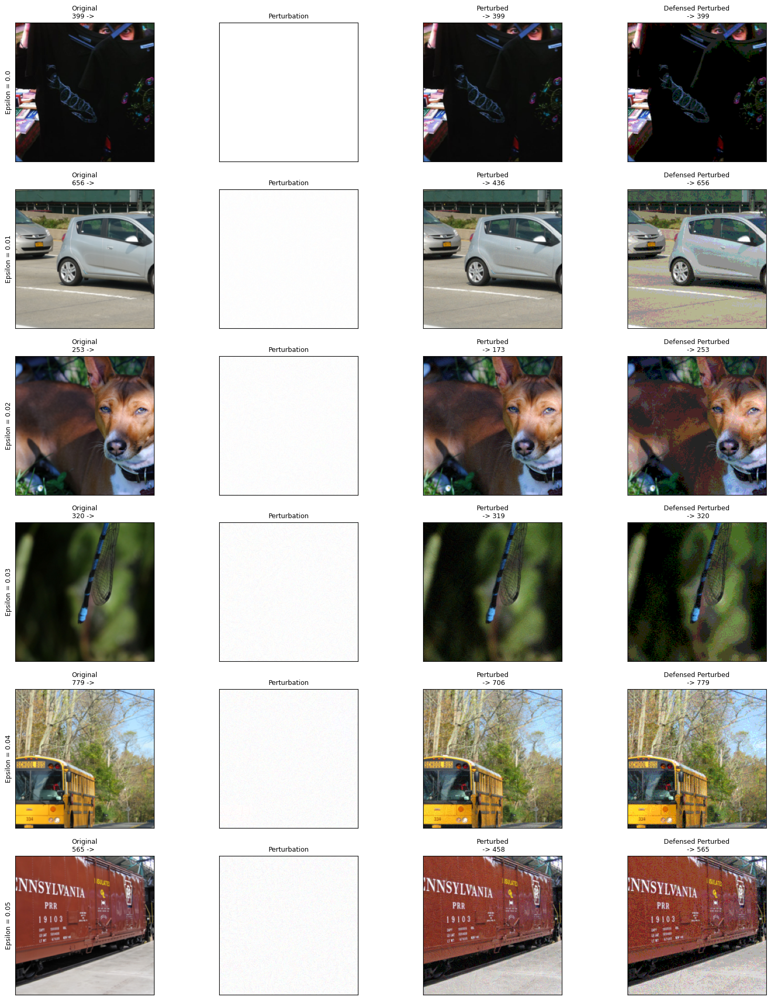

In [ ]:

show_exp_def(epsilons2, examples_r_p_d)

In [ ]:
accuracies_r_p_d_t = []
examples_r_p_d_t = []

model_resnet = torch.hub.load("pytorch/vision", "resnet50", weights="IMAGENET1K_V2")
model_resnet = model_resnet.to(device)
model_resnet.eval()


# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_PGD_d(model_resnet, device, test_loader_r, eps, targeted = True)
    accuracies_r_p_d_t.append(acc)
    examples_r_p_d_t.append(ex)

Using cache found in /root/.cache/torch/hub/pytorch_vision_main


	Epsilon: 0.0	Test Accuracy = 780 / 877 = 0.8893956670467503
	Epsilon: 0.01	Test Accuracy = 751 / 877 = 0.8563283922462942
	Epsilon: 0.02	Test Accuracy = 681 / 877 = 0.7765108323831242
	Epsilon: 0.03	Test Accuracy = 551 / 877 = 0.6282782212086659
	Epsilon: 0.04	Test Accuracy = 472 / 877 = 0.5381984036488028
	Epsilon: 0.05	Test Accuracy = 399 / 877 = 0.4549600912200684


### MOBILENET - BIM - FUTURE SQUEEZING

In [22]:
accuracies_m_b_d = []
examples_m_b_d = []

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_BIM_d(model_mobilenet, device, test_loader_m, eps, targeted = False)
    accuracies_m_b_d.append(acc)
    examples_m_b_d.append(ex)

	Epsilon: 0.0	Test Accuracy = 307 / 877 = 0.3500570125427594
	Epsilon: 0.01	Test Accuracy = 39 / 877 = 0.04446978335233751
	Epsilon: 0.02	Test Accuracy = 2 / 877 = 0.002280501710376283
	Epsilon: 0.03	Test Accuracy = 1 / 877 = 0.0011402508551881414
	Epsilon: 0.04	Test Accuracy = 0 / 877 = 0.0
	Epsilon: 0.05	Test Accuracy = 0 / 877 = 0.0


In [23]:
accuracies_m_b_d_t = []
examples_m_b_d_t = []

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_BIM_d(model_mobilenet, device, test_loader_m, eps, targeted = True)
    accuracies_m_b_d_t.append(acc)
    examples_m_b_d_t.append(ex)

	Epsilon: 0.0	Test Accuracy = 307 / 877 = 0.3500570125427594
	Epsilon: 0.01	Test Accuracy = 245 / 877 = 0.27936145952109465
	Epsilon: 0.02	Test Accuracy = 82 / 877 = 0.09350057012542759
	Epsilon: 0.03	Test Accuracy = 34 / 877 = 0.03876852907639681
	Epsilon: 0.04	Test Accuracy = 15 / 877 = 0.01710376282782212
	Epsilon: 0.05	Test Accuracy = 7 / 877 = 0.00798175598631699


### MOBILENET - PGD - FUTURE SQUEEZING

In [24]:
accuracies_m_p_d = []
examples_m_p_d = []

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_PGD_d(model_mobilenet, device, test_loader_m, eps, targeted = False)
    accuracies_m_p_d.append(acc)
    examples_m_p_d.append(ex)

	Epsilon: 0.0	Test Accuracy = 307 / 877 = 0.3500570125427594
	Epsilon: 0.01	Test Accuracy = 40 / 877 = 0.04561003420752566
	Epsilon: 0.02	Test Accuracy = 1 / 877 = 0.0011402508551881414
	Epsilon: 0.03	Test Accuracy = 1 / 877 = 0.0011402508551881414
	Epsilon: 0.04	Test Accuracy = 0 / 877 = 0.0
	Epsilon: 0.05	Test Accuracy = 0 / 877 = 0.0


In [25]:
accuracies_m_p_d_t = []
examples_m_p_d_t = []

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_PGD_d(model_mobilenet, device, test_loader_m, eps, targeted = True)
    accuracies_m_p_d_t.append(acc)
    examples_m_p_d_t.append(ex)

	Epsilon: 0.0	Test Accuracy = 307 / 877 = 0.3500570125427594
	Epsilon: 0.01	Test Accuracy = 250 / 877 = 0.28506271379703535
	Epsilon: 0.02	Test Accuracy = 115 / 877 = 0.13112884834663627
	Epsilon: 0.03	Test Accuracy = 57 / 877 = 0.06499429874572406
	Epsilon: 0.04	Test Accuracy = 30 / 877 = 0.03420752565564424
	Epsilon: 0.05	Test Accuracy = 16 / 877 = 0.018244013683010263


### INCEPTION - FGSM - FUTURE SQUEEZING

In [26]:
accuracies_i_f_d = []
examples_i_f_d = []

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_fgsm_feature_squeezing(model_inception, device, test_loader_i, eps, targeted = False)
    accuracies_i_f_d.append(acc)
    examples_i_f_d.append(ex)

	Epsilon: 0.0	Test Accuracy = 447 / 877 = 0.5096921322690992
	Epsilon: 0.01	Test Accuracy = 137 / 877 = 0.15621436716077536
	Epsilon: 0.02	Test Accuracy = 86 / 877 = 0.09806157354618016
	Epsilon: 0.03	Test Accuracy = 64 / 877 = 0.07297605473204105
	Epsilon: 0.04	Test Accuracy = 58 / 877 = 0.0661345496009122
	Epsilon: 0.05	Test Accuracy = 52 / 877 = 0.059293044469783354


In [27]:
accuracies_i_f_d_t = []
examples_i_f_d_t = []

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_fgsm_feature_squeezing(model_inception, device, test_loader_i, eps, targeted = True)
    accuracies_i_f_d_t.append(acc)
    examples_i_f_d_t.append(ex)

	Epsilon: 0.0	Test Accuracy = 447 / 877 = 0.5096921322690992
	Epsilon: 0.01	Test Accuracy = 335 / 877 = 0.38198403648802737
	Epsilon: 0.02	Test Accuracy = 267 / 877 = 0.30444697833523376
	Epsilon: 0.03	Test Accuracy = 225 / 877 = 0.25655644241733183
	Epsilon: 0.04	Test Accuracy = 202 / 877 = 0.23033067274800456
	Epsilon: 0.05	Test Accuracy = 180 / 877 = 0.20524515393386544


### INCEPTION - BIM - FUTURE SQUEEZING

In [28]:
accuracies_i_b_d = []
examples_i_b_d = []

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_BIM_d(model_inception, device, test_loader_i, eps, targeted = False)
    accuracies_i_b_d.append(acc)
    examples_i_b_d.append(ex)

	Epsilon: 0.0	Test Accuracy = 447 / 877 = 0.5096921322690992
	Epsilon: 0.01	Test Accuracy = 129 / 877 = 0.14709236031927023
	Epsilon: 0.02	Test Accuracy = 13 / 877 = 0.014823261117445839
	Epsilon: 0.03	Test Accuracy = 4 / 877 = 0.004561003420752566
	Epsilon: 0.04	Test Accuracy = 3 / 877 = 0.0034207525655644243
	Epsilon: 0.05	Test Accuracy = 0 / 877 = 0.0


In [29]:
accuracies_i_b_d_t = []
examples_i_b_d_t = []

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_BIM_d(model_inception, device, test_loader_i, eps, targeted = True)
    accuracies_i_b_d_t.append(acc)
    examples_i_b_d_t.append(ex)

	Epsilon: 0.0	Test Accuracy = 447 / 877 = 0.5096921322690992
	Epsilon: 0.01	Test Accuracy = 334 / 877 = 0.3808437856328392
	Epsilon: 0.02	Test Accuracy = 180 / 877 = 0.20524515393386544
	Epsilon: 0.03	Test Accuracy = 105 / 877 = 0.11972633979475485
	Epsilon: 0.04	Test Accuracy = 63 / 877 = 0.07183580387685291
	Epsilon: 0.05	Test Accuracy = 48 / 877 = 0.05473204104903079


### INCEPTION - PGD - FUTURE SQUEEZING

In [30]:
accuracies_i_p_d = []
examples_i_p_d = []

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_PGD_d(model_inception, device, test_loader_i, eps, targeted = False)
    accuracies_i_p_d.append(acc)
    examples_i_p_d.append(ex)

	Epsilon: 0.0	Test Accuracy = 447 / 877 = 0.5096921322690992
	Epsilon: 0.01	Test Accuracy = 124 / 877 = 0.14139110604332952
	Epsilon: 0.02	Test Accuracy = 20 / 877 = 0.02280501710376283
	Epsilon: 0.03	Test Accuracy = 7 / 877 = 0.00798175598631699
	Epsilon: 0.04	Test Accuracy = 4 / 877 = 0.004561003420752566
	Epsilon: 0.05	Test Accuracy = 3 / 877 = 0.0034207525655644243


In [31]:
accuracies_i_p_d_t = []
examples_i_p_d_t = []

# Run test for each epsilon
for eps in epsilons2:
    acc, ex = test_PGD_d(model_inception, device, test_loader_i, eps, targeted = True)
    accuracies_i_p_d_t.append(acc)
    examples_i_p_d_t.append(ex)

	Epsilon: 0.0	Test Accuracy = 447 / 877 = 0.5096921322690992
	Epsilon: 0.01	Test Accuracy = 336 / 877 = 0.3831242873432155
	Epsilon: 0.02	Test Accuracy = 201 / 877 = 0.2291904218928164
	Epsilon: 0.03	Test Accuracy = 129 / 877 = 0.14709236031927023
	Epsilon: 0.04	Test Accuracy = 95 / 877 = 0.10832383124287344
	Epsilon: 0.05	Test Accuracy = 69 / 877 = 0.07867730900798175




---



---


# EXTRA
---



---


## SPATIAL SMOOTHING

In [ ]:
# Spatial smoothing function
"""
def spatial_smoothing(image, kernel_size=3):
    # Apply spatial smoothing using a 2D convolution
    kernel = torch.ones(1, 1, kernel_size, kernel_size) / (kernel_size ** 2)
    smoothed_image = F.conv2d(image, kernel, padding=kernel_size//2)
    return smoothed_image
"""

def spatial_smoothing(image, kernel_size=3):

    device = image.device
    # Split the image tensor into individual channels
    channels = torch.split(image, 1, dim=1)

    # Apply spatial smoothing to each channel
    smoothed_channels = []
    for channel in channels:
        kernel = torch.ones(1, 1, kernel_size, kernel_size, device = device) / (kernel_size ** 2)
        smoothed_channel = F.conv2d(channel, kernel, padding=kernel_size//2)
        smoothed_channels.append(smoothed_channel)

    # Concatenate the smoothed channels back into an image tensor
    smoothed_image = torch.cat(smoothed_channels, dim=1)

    return smoothed_image

def test_fgsm_spatial_smoothing(model, device, loader, epsilon, kernel_size=3):
    model.eval()
    correct = 0

    for _, image, label, target in loader:
        image, label = image.to(device), label.to(device)

        # Apply FGSM attack
        image.requires_grad = True
        output = model(image)
        loss = F.nll_loss(output, label)
        model.zero_grad()
        loss.backward()
        data_grad = image.grad.data
        perturbed_image = fgsm_attack(image, epsilon, data_grad)

        # Apply Spatial Smoothing
        smoothed_image = spatial_smoothing(perturbed_image, kernel_size)

        # Classify the smoothed image
        output = model(smoothed_image)

        # Check for success
        final_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability
        #final_pred2 = defend_output.max(1, keepdim=True)[1] # get the index of the max log-probability

        #print(final_pred.item(), target.item(), "\n\n")

        if (final_pred.item()) == label.item():
            correct += 1


    final_acc = correct/float(len(loader))
    print("\tEpsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(loader), final_acc))

    return final_acc

### RESNET - FGSM - SPATIAL SQUEEZING

Original FGSM attack performance on RESNET

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.05	Test Accuracy = 376 / 877 = 0.42873432155074115
	Epsilon: 0.1	Test Accuracy = 284 / 877 = 0.3238312428734322
	Epsilon: 0.15	Test Accuracy = 167 / 877 = 0.1904218928164196
	Epsilon: 0.2	Test Accuracy = 97 / 877 = 0.11060433295324971
	Epsilon: 0.25	Test Accuracy = 59 / 877 = 0.06727480045610035

In [ ]:
#epsilons = [.1, .2] #, .15, .2, .25]
epsilons = [.00, .05, .1, .15, .2, .25]
accuracies_r_f_dss = []
examples_r_f_dss = []
model_resnet.eval()
# Run test for each epsilon
for eps in epsilons:
    #acc, ex =
    acc = test_fgsm_spatial_smoothing(model_resnet, device, test_loader_r, eps)
    accuracies_r_f_dss.append(acc)
    #examples_r_f_d.append(ex)

	Epsilon: 0.0	Test Accuracy = 763 / 877 = 0.8700114025085519
	Epsilon: 0.05	Test Accuracy = 477 / 877 = 0.5438996579247435
	Epsilon: 0.1	Test Accuracy = 349 / 877 = 0.3979475484606613
	Epsilon: 0.15	Test Accuracy = 245 / 877 = 0.27936145952109465
	Epsilon: 0.2	Test Accuracy = 163 / 877 = 0.18586088939566706
	Epsilon: 0.25	Test Accuracy = 94 / 877 = 0.10718358038768529


In [ ]:
#epsilons = [.1, .2] #, .15, .2, .25]
epsilons = [.00, .05, .1, .15, .2, .25]
accuracies_r_f_dss = []
examples_r_f_dss = []
model_resnet.eval()
# Run test for each epsilon
for eps in epsilons2:
    #acc, ex =
    acc = test_fgsm_spatial_smoothing(model_resnet, device, test_loader_r, eps)
    accuracies_r_f_dss.append(acc)
    #examples_r_f_d.append(ex)

	Epsilon: 0.0	Test Accuracy = 763 / 877 = 0.8700114025085519
	Epsilon: 0.01	Test Accuracy = 611 / 877 = 0.6966932725199544
	Epsilon: 0.02	Test Accuracy = 548 / 877 = 0.6248574686431014
	Epsilon: 0.03	Test Accuracy = 523 / 877 = 0.5963511972633979
	Epsilon: 0.04	Test Accuracy = 501 / 877 = 0.5712656784492588
	Epsilon: 0.05	Test Accuracy = 477 / 877 = 0.5438996579247435


## INPUT NORMALIZATION

In [ ]:
# Normalize input data
def normalize_input(image):
    normalize = transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    normalized_image = normalize(image)
    return normalized_image

def test_FGSM_normalization( model, device, loader, epsilon, targeted = False):

    # Accuracy counter
    correct = 0
    adv_examples = []
    #model.to(device)
    model.eval()

    # Loop over all examples in test set
    for _, image, label, target in loader:
      # Send the data and label to the device
        image = image.to(device)
        label = label.to(device)
        target = target.to(device)

        # Set requires_grad attribute of tensor. Important for Attack
        image.requires_grad = True
        #print(image)
        # Forward pass the data through the model
        output = model(image)
        init_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

        # If the initial prediction is wrong, don't bother attacking, just move on - SO DONT BOTHER DEFENSING OFC
        if (init_pred.item()) != label.item():
            #model.zero_grad()
            continue

        # Calculate the loss
        if targeted == True :
            loss = - (F.nll_loss(output, target))
        else :
            loss = F.nll_loss(output, label)
        # Zero all existing gradients
        model.zero_grad()

        # Calculate gradients of model in backward pass
        loss.backward(retain_graph=True) #retain_graph=True

        # Collect ``datagrad``
        data_grad = image.grad.data

        # Call FGSM Attack
        perturbed_data = fgsm_attack(image, epsilon, data_grad)

        # Apply Feature Squeezing
        squeezed_image = normalize_input(perturbed_data)

        # Classify the squeezed image
        output = model(squeezed_image)

        # Check for success
        final_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability
        #final_pred2 = defend_output.max(1, keepdim=True)[1] # get the index of the max log-probability

        #print(final_pred.item(), target.item(), "\n\n")

        if (final_pred.item()) == label.item():
            correct += 1
            # Special case for saving 0 epsilon examples
            if (epsilon == 0) and (len(adv_examples) < 5):
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )
        else:
            # Save some adv examples for visualization later
            if len(adv_examples) < 5:
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )

    # Calculate final accuracy for this epsilon
    final_acc = correct/float(len(loader))
    print("\tEpsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(loader), final_acc))

    # Return the accuracy and an adversarial example
    return final_acc, adv_examples

### RESNET - FGSM - INPUT NORMALIZATION

Original FGSM attack performance on RESNET

	Epsilon: 0.0	Test Accuracy = 834 / 877 = 0.95096921322691
	Epsilon: 0.05	Test Accuracy = 376 / 877 = 0.42873432155074115
	Epsilon: 0.1	Test Accuracy = 284 / 877 = 0.3238312428734322
	Epsilon: 0.15	Test Accuracy = 167 / 877 = 0.1904218928164196
	Epsilon: 0.2	Test Accuracy = 97 / 877 = 0.11060433295324971
	Epsilon: 0.25	Test Accuracy = 59 / 877 = 0.06727480045610035

In [ ]:
#epsilons = [.1, .2] #, .15, .2, .25]
epsilons = [.00, .05, .1, .15, .2, .25]
accuracies_r_f_dsn = []
examples_r_f_dsn = []
model_resnet.eval()

# Run test for each epsilon
for eps in epsilons:
    #acc, ex =
    acc = test_FGSM_normalization(model_resnet, device, test_loader_r, eps)
    accuracies_r_f_dsn.append(acc)
    #examples_r_f_d.append(ex)

	Epsilon: 0.0	Test Accuracy = 823 / 877 = 0.9384264538198404
	Epsilon: 0.05	Test Accuracy = 393 / 877 = 0.44811858608893956
	Epsilon: 0.1	Test Accuracy = 289 / 877 = 0.3295324971493729
	Epsilon: 0.15	Test Accuracy = 178 / 877 = 0.20296465222348917
	Epsilon: 0.2	Test Accuracy = 118 / 877 = 0.1345496009122007
	Epsilon: 0.25	Test Accuracy = 78 / 877 = 0.08893956670467502


In [ ]:
#epsilons = [.1, .2] #, .15, .2, .25]
epsilons = [.00, .05, .1, .15, .2, .25]
accuracies_r_f_dsn = []
examples_r_f_dsn = []
model_resnet.eval()

# Run test for each epsilon
for eps in epsilons2:
    #acc, ex =
    acc = test_FGSM_normalization(model_resnet, device, test_loader_r, eps)
    accuracies_r_f_dsn.append(acc)
    examples_r_f_dsn.append(ex)

	Epsilon: 0.0	Test Accuracy = 823 / 877 = 0.9384264538198404
	Epsilon: 0.01	Test Accuracy = 443 / 877 = 0.5051311288483467
	Epsilon: 0.02	Test Accuracy = 422 / 877 = 0.4811858608893957
	Epsilon: 0.03	Test Accuracy = 411 / 877 = 0.46864310148232613
	Epsilon: 0.04	Test Accuracy = 402 / 877 = 0.4583808437856328
	Epsilon: 0.05	Test Accuracy = 393 / 877 = 0.44811858608893956


*All defense algorithms on RESNET FGSM seems to reduce attack's effect.*

# RESULTS

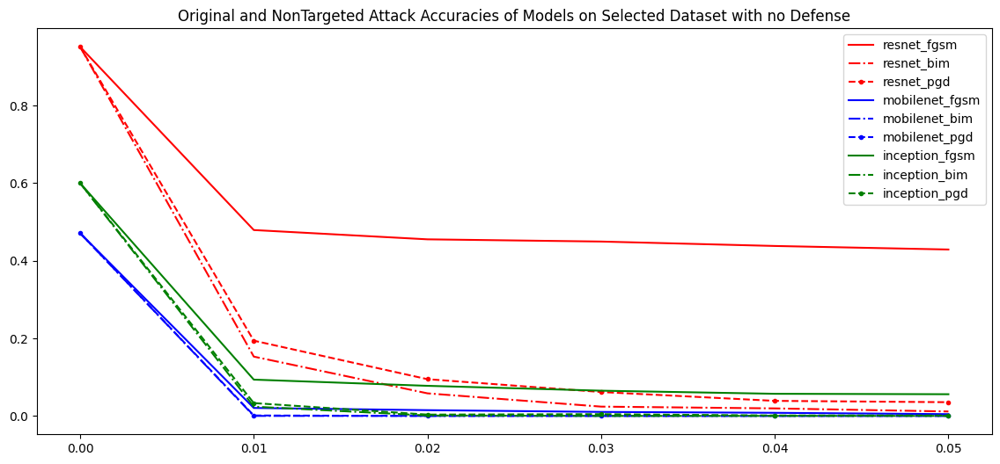

In [ ]:
plt.figure(figsize=(14,6))
plt.plot(epsilons2, accuracies_r_f, 'r-', label = "resnet_fgsm")
plt.plot(epsilons2, accuracies_r_b, 'r-.', label = "resnet_bim")
plt.plot(epsilons2, accuracies_r_p, 'r--.', label = "resnet_pgd")
plt.plot(epsilons2, accuracies_m_f, 'b-', label = "mobilenet_fgsm")
plt.plot(epsilons2, accuracies_m_b, 'b-.', label = "mobilenet_bim")
plt.plot(epsilons2, accuracies_m_p, 'b--.', label = "mobilenet_pgd")
plt.plot(epsilons2, accuracies_i_f, 'g-', label = "inception_fgsm")
plt.plot(epsilons2, accuracies_i_b, 'g-.', label = "inception_bim")
plt.plot(epsilons2, accuracies_i_p, 'g--.', label = "inception_pgd")  #, linestyle=":")
plt.title('Original and NonTargeted Attack Accuracies of Models on Selected Dataset with no Defense')
plt.legend()
plt.show()


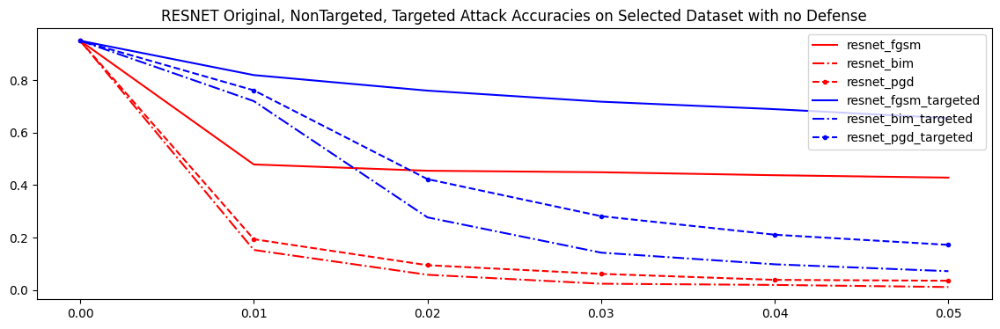

In [ ]:
plt.figure(figsize=(14,4))
plt.plot(epsilons2, accuracies_r_f, 'r-', label = "resnet_fgsm")
plt.plot(epsilons2, accuracies_r_b, 'r-.', label = "resnet_bim")
plt.plot(epsilons2, accuracies_r_p, 'r--.', label = "resnet_pgd")
plt.plot(epsilons2, accuracies_r_f_t, 'b-', label = "resnet_fgsm_targeted")
plt.plot(epsilons2, accuracies_r_b_t, 'b-.', label = "resnet_bim_targeted")
plt.plot(epsilons2, accuracies_r_p_t, 'b--.', label = "resnet_pgd_targeted")
plt.title('RESNET Original, NonTargeted, Targeted Attack Accuracies on Selected Dataset with no Defense')
plt.legend()
plt.show()


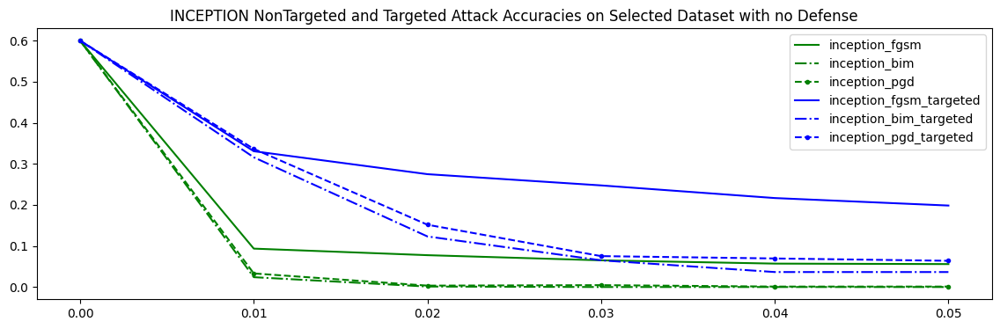

In [ ]:
plt.figure(figsize=(14,4))
plt.plot(epsilons2, accuracies_i_f, 'g-', label = "inception_fgsm")
plt.plot(epsilons2, accuracies_i_b, 'g-.', label = "inception_bim")
plt.plot(epsilons2, accuracies_i_p, 'g--.', label = "inception_pgd")
plt.plot(epsilons2, accuracies_i_f_t, 'b-', label = "inception_fgsm_targeted")
plt.plot(epsilons2, accuracies_i_b_t, 'b-.', label = "inception_bim_targeted")
plt.plot(epsilons2, accuracies_i_p_t, 'b--.', label = "inception_pgd_targeted")
plt.title('INCEPTION NonTargeted and Targeted Attack Accuracies on Selected Dataset with no Defense')
plt.legend()
plt.show()


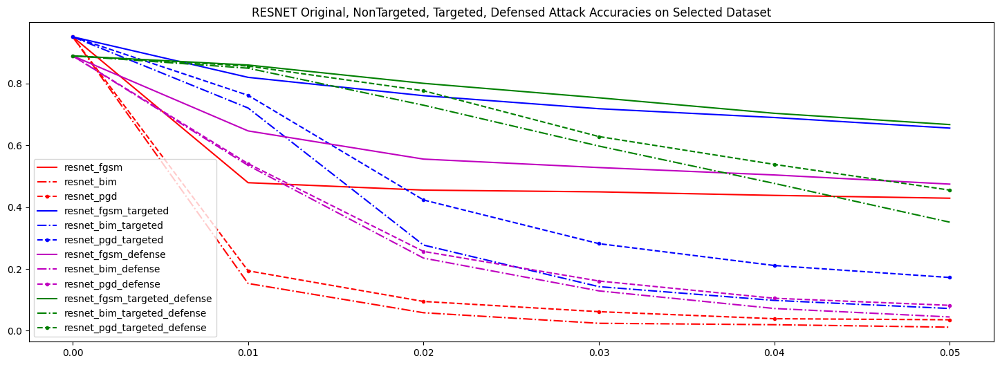

In [ ]:
plt.figure(figsize=(18,6))
plt.plot(epsilons2, accuracies_r_f, 'r-', label = "resnet_fgsm")
plt.plot(epsilons2, accuracies_r_b, 'r-.', label = "resnet_bim")
plt.plot(epsilons2, accuracies_r_p, 'r--.', label = "resnet_pgd")
plt.plot(epsilons2, accuracies_r_f_t, 'b-', label = "resnet_fgsm_targeted")
plt.plot(epsilons2, accuracies_r_b_t, 'b-.', label = "resnet_bim_targeted")
plt.plot(epsilons2, accuracies_r_p_t, 'b--.', label = "resnet_pgd_targeted")
plt.plot(epsilons2, accuracies_r_f_d, 'm-', label = "resnet_fgsm_defense")
plt.plot(epsilons2, accuracies_r_b_d, 'm-.', label = "resnet_bim_defense")
plt.plot(epsilons2, accuracies_r_p_d, 'm--.', label = "resnet_pgd_defense")
plt.plot(epsilons2, accuracies_r_f_d_t, 'g-', label = "resnet_fgsm_targeted_defense") #defense
plt.plot(epsilons2, accuracies_r_b_d_t, 'g-.', label = "resnet_bim_targeted_defense")
plt.plot(epsilons2, accuracies_r_p_d_t, 'g--.', label = "resnet_pgd_targeted_defense")
plt.title('RESNET Original, NonTargeted, Targeted, Defensed Attack Accuracies on Selected Dataset')
plt.legend()#(loc='upper right')
plt.show()
